In [1]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install torchmetrics

In [3]:
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
from torchvision.transforms import functional as F
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
import torchvision.models.detection as models
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, ssd300_vgg16
from tqdm import tqdm

# Function to load a single image
def load_image(image_path):
    return cv2.imread(image_path)

# Defining the path where the images are stored
image_path = r"/content/drive/MyDrive/NNDL/Signs/FullIJCNN2013/"
annotation_file = r"/content/drive/MyDrive/NNDL/Signs/Annotations/gt.txt"



Processing image: 00000.ppm
Full image path: /content/drive/MyDrive/NNDL/Signs/FullIJCNN2013/00000.ppm


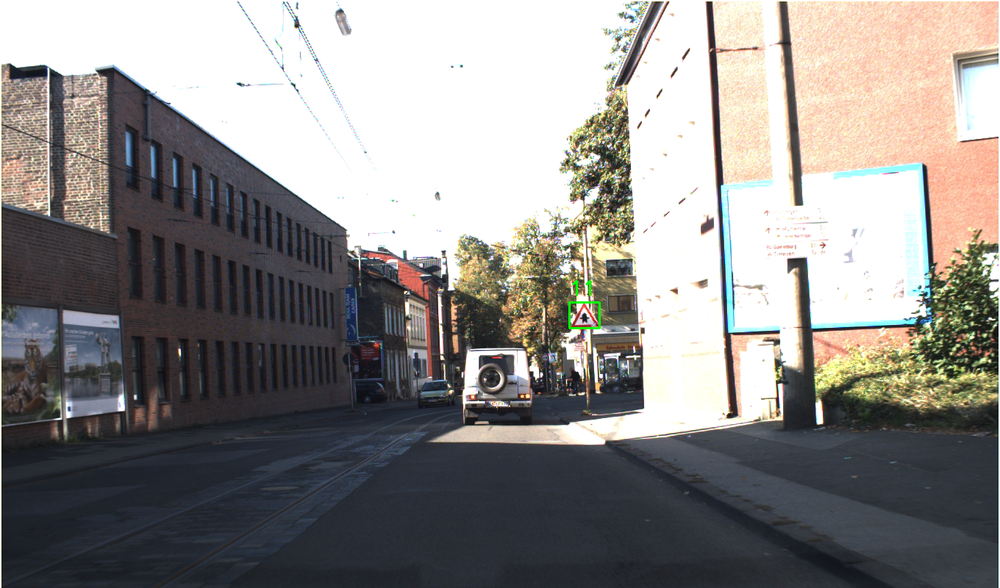

In [ ]:
# Check if the annotation file exists
if not os.path.exists(annotation_file):
    print(f"Error: The file {annotation_file} was not found. Please check the file path.")
else:
    # Reading the annotation file
    with open(annotation_file, "r") as file:
        annotations = file.readlines()

    # Selecting three images and displaying annotations
    selected_images = ["00000.ppm", "00001.ppm", "00002.ppm"]
    images = []

    for image_name in selected_images:
        print(f"\nProcessing image: {image_name}")
        full_image_path = os.path.join(image_path, image_name)
        print(f"Full image path: {full_image_path}")
        image = load_image(full_image_path)

        if image is None:
            print(f"Error: The image {image_name} was not found or could not be loaded.")
            continue

        # Finding annotations related to this image
        for line in annotations:
            parts = line.strip().split(";")
            if parts[0] == image_name:
                left, top, right, bottom, class_id = map(int, parts[1:])
                cv2.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)
                cv2.putText(image, str(class_id), (left, top-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

        cv2_imshow(image)  # Use cv2_imshow() instead of cv2.imshow()
        images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for Matplotlib

    # Display images in a row
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    for ax, img, title in zip(axs, images, selected_images):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')

    plt.show()


In [ ]:
# Size and Class Counting
size_counts = {'small': 0, 'medium': 0, 'large': 0}
class_counts = {'prohibitory': 0, 'danger': 0, 'mandatory': 0, 'other': 0}

# Size thresholds
small_threshold = 32 * 32
medium_threshold = 96 * 96

# Class mappings
class_mapping = {
    0: 'prohibitory', 1: 'prohibitory', 2: 'prohibitory', 3: 'prohibitory',
    4: 'prohibitory', 5: 'prohibitory', 6: 'other', 7: 'prohibitory',
    8: 'prohibitory', 9: 'prohibitory', 10: 'prohibitory', 11: 'danger',
    12: 'other', 13: 'other', 14: 'other', 15: 'prohibitory', 16: 'prohibitory',
    17: 'other', 18: 'danger', 19: 'danger', 20: 'danger', 21: 'danger',
    22: 'danger', 23: 'danger', 24: 'danger', 25: 'danger', 26: 'danger',
    27: 'danger', 28: 'danger', 29: 'danger', 30: 'danger', 31: 'danger',
    32: 'other', 33: 'mandatory', 34: 'mandatory', 35: 'mandatory',
    36: 'mandatory', 37: 'mandatory', 38: 'mandatory', 39: 'mandatory',
    40: 'mandatory', 41: 'other', 42: 'other'
}

# Process annotations to count sizes and classes
for line in annotations:
    parts = line.strip().split(";")
    left, top, right, bottom, class_id = map(int, parts[1:])
    width = right - left
    height = bottom - top
    area = width * height

    # Determine size category
    if area < small_threshold:
        size_counts['small'] += 1
    elif area < medium_threshold:
        size_counts['medium'] += 1
    else:
        size_counts['large'] += 1

    # Determine class category
    class_type = class_mapping[class_id]
    class_counts[class_type] += 1

# Plot histograms
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Size histogram
ax[0].bar(size_counts.keys(), size_counts.values())
ax[0].set_title('Object Size Distribution')
ax[0].set_xlabel('Size')
ax[0].set_ylabel('Frequency')

# Class histogram
ax[1].bar(class_counts.keys(), class_counts.values())
ax[1].set_title('Class Distribution')
ax[1].set_xlabel('Class')
ax[1].set_ylabel('Frequency')

plt.show()


In [55]:
# Define Dataset
class TrafficSignDataset(Dataset):
    def __init__(self, images, annotations, image_dir, transform=None):
        self.images = images
        self.annotations = annotations
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_name = self.images[idx]
        image_path = os.path.join(self.image_dir, image_name)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        boxes = []
        labels = []
        for line in self.annotations:
            parts = line.strip().split(";")
            if parts[0] == image_name:
                left, top, right, bottom, class_id = map(int, parts[1:])
                boxes.append([left, top, right, bottom])
                labels.append(class_id)

        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}

        if self.transform:
            image = self.transform(image)

        return image, target

# Transform, Dataset, DataLoader
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

images = sorted(os.listdir(image_path))
train_images, eval_images = train_test_split(images, test_size=0.2, random_state=42)

train_dataset = TrafficSignDataset(train_images, annotations, image_path, transform=transform)
eval_dataset = TrafficSignDataset(eval_images, annotations, image_path, transform=transform)


In [56]:
# EarlyStopping class
class EarlyStopping:
    def __init__(self, patience=5, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss:
            self.counter += 1
            if self.verbose:
                print(f"EarlyStopping counter: {self.counter} out of {self.patience}")
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0


In [62]:
# Define data loaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=lambda x: tuple(zip(*x)), num_workers=4)
eval_loader = DataLoader(eval_dataset, batch_size=8, shuffle=False, collate_fn=lambda x: tuple(zip(*x)), num_workers=4)


In [63]:
import torch
from torchvision.models.detection import ssd300_vgg16
from torch import nn, optim
from tqdm import tqdm
import numpy as np
import random

# Load the SSD300-VGG16 model
model_ssd = ssd300_vgg16(weights="SSD300_VGG16_Weights.DEFAULT")

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_ssd.to(device)

# Define optimizer and learning rate
optimizer = optim.Adam(model_ssd.parameters(), lr=0.0001)

# Lists for tracking metrics
train_losses = []
iou_scores = []
map_scores = []

def plot_metrics():
    plt.figure(figsize=(12, 4))

    # Plot Loss
    plt.subplot(1, 3, 1)
    plt.plot(train_losses, label="Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training Loss")
    plt.legend()

    # Plot IoU
    plt.subplot(1, 3, 2)
    plt.plot(iou_scores, label="IoU")
    plt.xlabel("Epoch (x5)")
    plt.ylabel("IoU")
    plt.title("IoU per 5 Epochs")
    plt.legend()

    # Plot mAP
    plt.subplot(1, 3, 3)
    plt.plot(map_scores, label="mAP")
    plt.xlabel("Epoch (x5)")
    plt.ylabel("mAP")
    plt.title("mAP per 5 Epochs")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Visualization Function
def visualize_predictions(images, targets, predictions, title):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    for i, (img, target, pred) in enumerate(zip(images[:3], targets[:3], predictions[:3])):
        img = img.permute(1, 2, 0).cpu().numpy()
        axs[i].imshow(img)

        # Draw ground truth
        for box, label in zip(target["boxes"], target["labels"]):
            x1, y1, x2, y2 = box.cpu().numpy()
            axs[i].add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor="green", fill=False, lw=2))
            axs[i].text(x1, y1 - 5, f"GT: {label.item()}", color="green", fontsize=8, bbox=dict(facecolor='white', alpha=0.5))

        # Draw predictions
        for box, label, score in zip(pred["boxes"], pred["labels"], pred["scores"]):
            x1, y1, x2, y2 = box.cpu().numpy()
            axs[i].add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor="red", fill=False, lw=2))
            axs[i].text(x1, y1 - 15, f"Pred: {label.item()} ({score:.2f})", color="red", fontsize=8, bbox=dict(facecolor='white', alpha=0.5))

        axs[i].set_title(f"{title} - Image {i + 1}")
        axs[i].axis("off")

    plt.tight_layout()
    plt.show()

# Define training function
def train_ssd(model, optimizer, train_loader, eval_loader, device, num_epochs):
    global train_losses, iou_scores, map_scores

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0

        for images, targets in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} - Training"):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Skip images without any targets
            if any(len(target["boxes"]) == 0 for target in targets):
                continue

            # Forward pass
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            # Backward pass and optimization
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            train_loss += losses.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        print(f"Epoch #{epoch + 1} - Train Loss: {train_loss:.4f}")

        # Evaluation every 5 epochs
        if (epoch + 1) % 15 == 0:
            mean_iou, mean_map = evaluate_ssd(model, eval_loader, device, epoch + 1)
            iou_scores.append(mean_iou)
            map_scores.append(mean_map)

            # Visualize 3 random images
            images, targets, predictions = get_random_predictions(model, eval_loader, device)
            visualize_predictions(images, targets, predictions, title=f"Epoch {epoch + 1}")

    # Plot metrics
    plot_metrics()



In [64]:
def compute_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x1_, y1_, x2_, y2_ = box2

    xi1, yi1 = max(x1, x1_), max(y1, y1_)
    xi2, yi2 = min(x2, x2_), min(y2, y2_)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)

    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2_ - x1_) * (y2_ - y1_)

    union_area = box1_area + box2_area - inter_area
    iou = inter_area / union_area
    return iou

# Compute mAP function
def mean_average_precision(true_boxes, pred_boxes, iou_threshold=0.5):
    aps = []
    true_labels = true_boxes["labels"].cpu().numpy()
    pred_labels = pred_boxes["labels"].cpu().numpy()

    for label in set(true_labels):
        # Filter true and predicted boxes by label
        true_boxes_label = true_boxes["boxes"][true_boxes["labels"] == label].cpu().numpy()
        pred_boxes_label = pred_boxes["boxes"][pred_boxes["labels"] == label].cpu().numpy()
        scores = pred_boxes["scores"][pred_boxes["labels"] == label].cpu().numpy()

        # Compute IoUs
        ious = []
        for tb in true_boxes_label:
            for pb in pred_boxes_label:
                ious.append(compute_iou(tb, pb))

        if len(ious) == 0:
            aps.append(0)
            continue

        ious = np.array(ious)
        ious.sort()

        tp = np.sum(ious >= iou_threshold)
        fp = np.sum(ious < iou_threshold)
        fn = len(true_boxes_label) - tp

        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        ap = precision * recall
        aps.append(ap)

    return np.mean(aps) if aps else 0



In [82]:
# Evaluation function
def evaluate_ssd(model, eval_loader, device, epoch):
    model.eval()
    iou_scores, map_scores = [], []

    with torch.no_grad():
        for images, targets in tqdm(eval_loader, desc="Evaluating"):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            predictions = model(images)

            for pred, target in zip(predictions, targets):
                if len(target["boxes"]) == 0:
                    continue

                # Compute IoU and mAP for SSD
                if len(pred["boxes"]) == 0:
                    iou_scores.append(0.0)
                    map_scores.append(0.0)
                else:
                    iou_scores.append(
                        compute_iou(target["boxes"][0].cpu().numpy(), pred["boxes"][0].cpu().numpy())
                    )
                    map_scores.append(
                        mean_average_precision(target, pred)
                    )

    mean_iou = np.mean(iou_scores) if iou_scores else 0
    mean_map = np.mean(map_scores) if map_scores else 0

    print(f"Epoch #{epoch} - Validation - SSD IoU: {mean_iou:.4f}, mAP: {mean_map:.4f}")
    return mean_iou, mean_map

# Get random predictions for visualization
def get_random_predictions(model, eval_loader, device):
    model.eval()
    with torch.no_grad():
        images, targets = next(iter(eval_loader))
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        predictions = model(images)

    indices = random.sample(range(len(images)), 4)
    random_images = [images[i] for i in indices]
    random_targets = [targets[i] for i in indices]
    random_predictions = [predictions[i] for i in indices]

    return random_images, random_targets, random_predictions

# Visualize final predictions
def visualize_final_predictions(model, eval_loader, device):
    model.eval()
    with torch.no_grad():
        images, targets = next(iter(eval_loader))
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        predictions = model(images)

    # Visualize 10 random images
    indices = random.sample(range(len(images)), 4)
    random_images = [images[i] for i in indices]
    random_targets = [targets[i] for i in indices]
    random_predictions = [predictions[i] for i in indices]

    visualize_predictions(random_images, random_targets, random_predictions, title="Final Predictions")


Epoch 1/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.68it/s]


Epoch #1 - Train Loss: 1.8016


Epoch 2/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.92it/s]


Epoch #2 - Train Loss: 1.6350


Epoch 3/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.72it/s]


Epoch #3 - Train Loss: 1.6247


Epoch 4/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.77it/s]


Epoch #4 - Train Loss: 1.0960


Epoch 5/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.80it/s]


Epoch #5 - Train Loss: 1.2385


Epoch 6/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.85it/s]


Epoch #6 - Train Loss: 1.6813


Epoch 7/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.91it/s]


Epoch #7 - Train Loss: 1.0822


Epoch 8/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.89it/s]


Epoch #8 - Train Loss: 0.9729


Epoch 9/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.74it/s]


Epoch #9 - Train Loss: 1.1603


Epoch 10/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.88it/s]


Epoch #10 - Train Loss: 1.1261


Epoch 11/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.82it/s]


Epoch #11 - Train Loss: 1.0254


Epoch 12/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.95it/s]


Epoch #12 - Train Loss: 0.8315


Epoch 13/60 - Training: 100%|██████████| 90/90 [00:29<00:00,  3.05it/s]


Epoch #13 - Train Loss: 1.0743


Epoch 14/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.78it/s]


Epoch #14 - Train Loss: 1.1051


Epoch 15/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.80it/s]


Epoch #15 - Train Loss: 0.9485


Evaluating: 100%|██████████| 23/23 [00:12<00:00,  1.90it/s]

Epoch #15 - Validation - SSD IoU: 0.4262, mAP: 0.1577


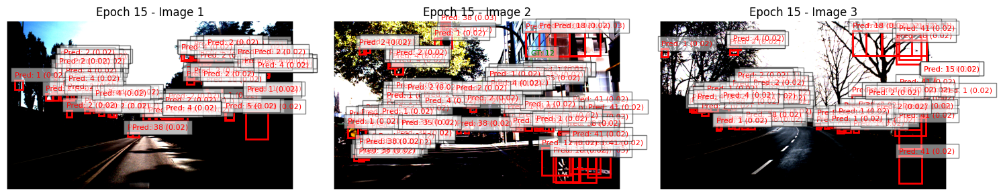

Epoch 16/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.81it/s]


Epoch #16 - Train Loss: 0.7296


Epoch 17/60 - Training: 100%|██████████| 90/90 [00:34<00:00,  2.63it/s]


Epoch #17 - Train Loss: 0.7683


Epoch 18/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.99it/s]


Epoch #18 - Train Loss: 0.9588


Epoch 19/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.77it/s]


Epoch #19 - Train Loss: 0.7730


Epoch 20/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.78it/s]


Epoch #20 - Train Loss: 0.8308


Epoch 21/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.97it/s]


Epoch #21 - Train Loss: 0.8243


Epoch 22/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.75it/s]


Epoch #22 - Train Loss: 0.9035


Epoch 23/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.71it/s]


Epoch #23 - Train Loss: 0.8360


Epoch 24/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.83it/s]


Epoch #24 - Train Loss: 0.9750


Epoch 25/60 - Training: 100%|██████████| 90/90 [00:34<00:00,  2.61it/s]


Epoch #25 - Train Loss: 0.9303


Epoch 26/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.93it/s]


Epoch #26 - Train Loss: 0.6572


Epoch 27/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.77it/s]


Epoch #27 - Train Loss: 0.7855


Epoch 28/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.86it/s]


Epoch #28 - Train Loss: 0.4606


Epoch 29/60 - Training: 100%|██████████| 90/90 [00:29<00:00,  3.05it/s]


Epoch #29 - Train Loss: 0.6187


Epoch 30/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.85it/s]


Epoch #30 - Train Loss: 0.5821


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]


Epoch #30 - Validation - SSD IoU: 0.4805, mAP: 0.3292


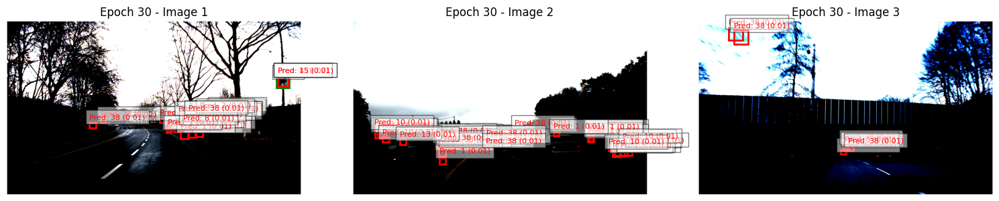

Epoch 31/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.69it/s]


Epoch #31 - Train Loss: 0.5878


Epoch 32/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.94it/s]


Epoch #32 - Train Loss: 0.4595


Epoch 33/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.75it/s]


Epoch #33 - Train Loss: 0.6025


Epoch 34/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.77it/s]


Epoch #34 - Train Loss: 0.4285


Epoch 35/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.94it/s]


Epoch #35 - Train Loss: 0.6513


Epoch 36/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.73it/s]


Epoch #36 - Train Loss: 0.7067


Epoch 37/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.78it/s]


Epoch #37 - Train Loss: 0.3549


Epoch 38/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.83it/s]


Epoch #38 - Train Loss: 0.4938


Epoch 39/60 - Training: 100%|██████████| 90/90 [00:29<00:00,  3.03it/s]


Epoch #39 - Train Loss: 0.4858


Epoch 40/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.65it/s]


Epoch #40 - Train Loss: 0.4659


Epoch 41/60 - Training: 100%|██████████| 90/90 [00:36<00:00,  2.50it/s]


Epoch #41 - Train Loss: 0.5071


Epoch 42/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.74it/s]


Epoch #42 - Train Loss: 0.5025


Epoch 43/60 - Training: 100%|██████████| 90/90 [00:29<00:00,  3.02it/s]


Epoch #43 - Train Loss: 0.4306


Epoch 44/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.80it/s]


Epoch #44 - Train Loss: 0.4778


Epoch 45/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.72it/s]


Epoch #45 - Train Loss: 0.6051


Evaluating: 100%|██████████| 23/23 [00:12<00:00,  1.86it/s]

Epoch #45 - Validation - SSD IoU: 0.4548, mAP: 0.4195


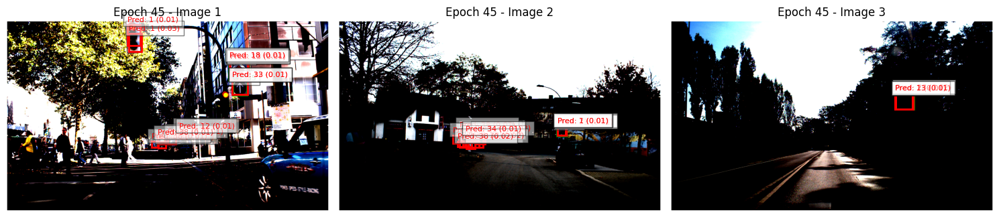

Epoch 46/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.74it/s]


Epoch #46 - Train Loss: 0.4600


Epoch 47/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.99it/s]


Epoch #47 - Train Loss: 0.3397


Epoch 48/60 - Training: 100%|██████████| 90/90 [00:34<00:00,  2.60it/s]


Epoch #48 - Train Loss: 0.4643


Epoch 49/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.73it/s]


Epoch #49 - Train Loss: 0.3970


Epoch 50/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.85it/s]


Epoch #50 - Train Loss: 0.3200


Epoch 51/60 - Training: 100%|██████████| 90/90 [00:30<00:00,  2.90it/s]


Epoch #51 - Train Loss: 0.4598


Epoch 52/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.80it/s]


Epoch #52 - Train Loss: 0.2567


Epoch 53/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.77it/s]


Epoch #53 - Train Loss: 0.3448


Epoch 54/60 - Training: 100%|██████████| 90/90 [00:29<00:00,  3.03it/s]


Epoch #54 - Train Loss: 0.2869


Epoch 55/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.73it/s]


Epoch #55 - Train Loss: 0.3261


Epoch 56/60 - Training: 100%|██████████| 90/90 [00:34<00:00,  2.63it/s]


Epoch #56 - Train Loss: 0.2739


Epoch 57/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.72it/s]


Epoch #57 - Train Loss: 0.3212


Epoch 58/60 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.79it/s]


Epoch #58 - Train Loss: 0.3742


Epoch 59/60 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.69it/s]


Epoch #59 - Train Loss: 0.2562


Epoch 60/60 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.84it/s]


Epoch #60 - Train Loss: 0.2736


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.72it/s]

Epoch #60 - Validation - SSD IoU: 0.4692, mAP: 0.4690


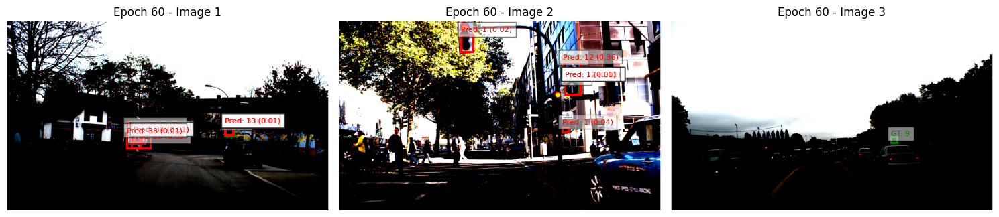

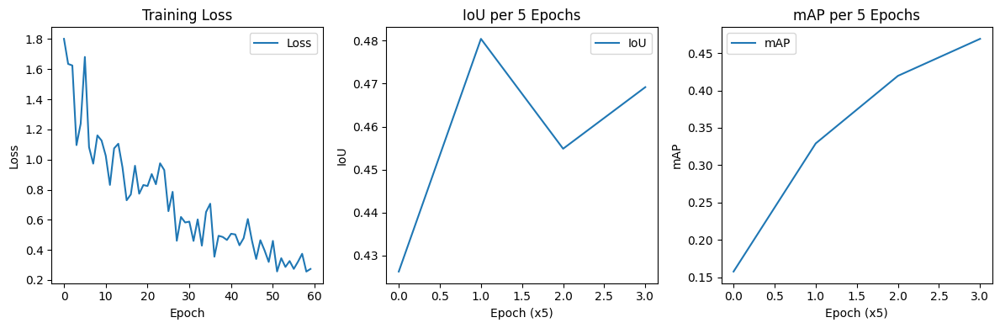

In [66]:
num_epochs = 60
train_ssd(model_ssd, optimizer, train_loader, eval_loader, device, num_epochs)


Epoch 1/15 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.87it/s]


Epoch #1 - Train Loss: 0.2502


Epoch 2/15 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.68it/s]


Epoch #2 - Train Loss: 0.2339


Epoch 3/15 - Training: 100%|██████████| 90/90 [00:34<00:00,  2.59it/s]


Epoch #3 - Train Loss: 0.2888


Epoch 4/15 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.81it/s]


Epoch #4 - Train Loss: 0.2629


Epoch 5/15 - Training: 100%|██████████| 90/90 [00:28<00:00,  3.14it/s]


Epoch #5 - Train Loss: 0.1763


Epoch 6/15 - Training: 100%|██████████| 90/90 [00:33<00:00,  2.67it/s]


Epoch #6 - Train Loss: 0.2711


Epoch 7/15 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.75it/s]


Epoch #7 - Train Loss: 0.2335


Epoch 8/15 - Training: 100%|██████████| 90/90 [00:29<00:00,  3.03it/s]


Epoch #8 - Train Loss: 0.2084


Epoch 9/15 - Training: 100%|██████████| 90/90 [00:31<00:00,  2.84it/s]


Epoch #9 - Train Loss: 0.1990


Epoch 10/15 - Training: 100%|██████████| 90/90 [00:35<00:00,  2.53it/s]


Epoch #10 - Train Loss: 0.2653


Epoch 11/15 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.79it/s]


Epoch #11 - Train Loss: 0.2170


Epoch 12/15 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.79it/s]


Epoch #12 - Train Loss: 0.2131


Epoch 13/15 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.76it/s]


Epoch #13 - Train Loss: 0.2570


Epoch 14/15 - Training: 100%|██████████| 90/90 [00:29<00:00,  3.05it/s]


Epoch #14 - Train Loss: 0.1577


Epoch 15/15 - Training: 100%|██████████| 90/90 [00:32<00:00,  2.73it/s]


Epoch #15 - Train Loss: 0.2177


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.58it/s]

Epoch #15 - Validation - SSD IoU: 0.4517, mAP: 0.4988


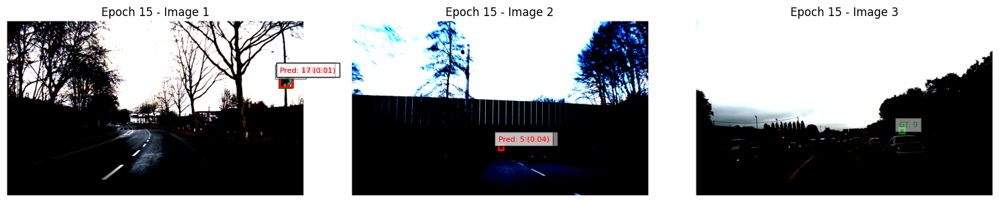

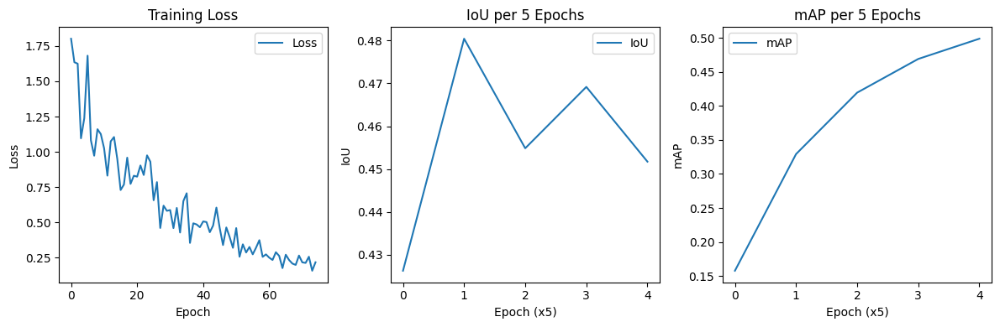

In [68]:
num_epochs = 15
train_ssd(model_ssd, optimizer, train_loader, eval_loader, device, num_epochs)

In [69]:
import os

# Define a path to save the model
save_path = "/content/drive/MyDrive/ssd300_vgg16_model.pth"

# Save the model's state_dict
torch.save(model_ssd.state_dict(), save_path)
print(f"Model saved to {save_path}")


Model saved to /content/drive/MyDrive/ssd300_vgg16_model.pth


<ipython-input-84-ca8b10043107>:40: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches.Patch(color='green', label='Ground Truth', edgecolor="none"),
<ipython-input-84-ca8b10043107>:41: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches.Patch(color='red', label='Prediction', edgecolor="none")


4


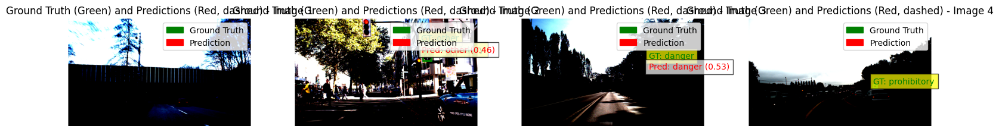

In [84]:
import matplotlib.patches as patches

def visualize_predictions_with_labels(images, targets, predictions, title="Predictions"):
    fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
    if len(images) == 1:
        axs = [axs]  # Make it iterable for a single image

    for i, (img, target, pred) in enumerate(zip(images, targets, predictions)):
        img = img.permute(1, 2, 0).cpu().numpy()
        axs[i].imshow(img)

        # Draw ground truth boxes (Green, solid)
        for box, label in zip(target["boxes"], target["labels"]):
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = patches.Rectangle(
                (x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor="green", facecolor="none"
            )
            axs[i].add_patch(rect)
            axs[i].text(
                x1, y1 - 5, f"GT: {class_mapping.get(label.item(), 'other')}",
                color="green", fontsize=10, bbox=dict(facecolor='yellow', alpha=0.7)
            )

        # Draw predicted boxes (Red, dashed)
        for box, label, score in zip(pred["boxes"], pred["labels"], pred["scores"]):
            if score >= 0.3:
                x1, y1, x2, y2 = box.cpu().numpy()
                rect = patches.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor="red", facecolor="none", linestyle="--"
                )
                axs[i].add_patch(rect)
                axs[i].text(
                    x1, y2 + 5, f"Pred: {class_mapping.get(label.item(), 'other')} ({score:.2})",
                    color="red", fontsize=10, bbox=dict(facecolor='white', alpha=0.7)
                )

        axs[i].set_title(f"{title} - Image {i + 1}")
        axs[i].legend(
            handles=[
                patches.Patch(color='green', label='Ground Truth', edgecolor="none"),
                patches.Patch(color='red', label='Prediction', edgecolor="none")
            ],
            loc="upper right"
        )
        axs[i].axis("off")

    plt.tight_layout()
    plt.show()

# Get predictions for a batch
images, targets, predictions = get_random_predictions(model_ssd, eval_loader, device)

print(len(images))

# Visualize the predictions
visualize_predictions_with_labels(images, targets, predictions, title="Ground Truth (Green) and Predictions (Red, dashed)")


In [85]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn

# Load the SSD300-VGG16 model
model_frcnn_res50 = fasterrcnn_resnet50_fpn(pretrained=True)

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_frcnn_res50.to(device)

# Define optimizer and learning rate
optimizer = optim.Adam(model_frcnn_res50.parameters(), lr=0.0001)

# Lists for tracking metrics
train_losses = []
iou_scores = []
map_scores = []

# Define training function
def train_frcnn_res50(model, optimizer, train_loader, eval_loader, device, num_epochs):
    global train_losses, iou_scores, map_scores

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0

        for images, targets in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} - Training"):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Skip images without any targets
            if any(len(target["boxes"]) == 0 for target in targets):
                continue

            # Forward pass
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            # Backward pass and optimization
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            train_loss += losses.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        print(f"Epoch #{epoch + 1} - Train Loss: {train_loss:.4f}")

        # Evaluation every 5 epochs
        if (epoch + 1) % 5 == 0:
            mean_iou, mean_map = evaluate_ssd(model, eval_loader, device, epoch + 1)
            iou_scores.append(mean_iou)
            map_scores.append(mean_map)

            # Visualize 3 random images
            images, targets, predictions = get_random_predictions(model, eval_loader, device)
            visualize_predictions(images, targets, predictions, title=f"Epoch {epoch + 1}")

    # Plot metrics
    plot_metrics()



/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/30 - Training: 100%|██████████| 90/90 [01:06<00:00,  1.36it/s]


Epoch #1 - Train Loss: 0.0668


Epoch 2/30 - Training: 100%|██████████| 90/90 [01:11<00:00,  1.26it/s]


Epoch #2 - Train Loss: 0.0684


Epoch 3/30 - Training: 100%|██████████| 90/90 [01:13<00:00,  1.23it/s]


Epoch #3 - Train Loss: 0.0617


Epoch 4/30 - Training: 100%|██████████| 90/90 [01:03<00:00,  1.41it/s]


Epoch #4 - Train Loss: 0.0382


Epoch 5/30 - Training: 100%|██████████| 90/90 [01:01<00:00,  1.45it/s]


Epoch #5 - Train Loss: 0.0324


Evaluating: 100%|██████████| 23/23 [00:26<00:00,  1.16s/it]


Epoch #5 - Validation - SSD IoU: 0.6102, mAP: 0.5279


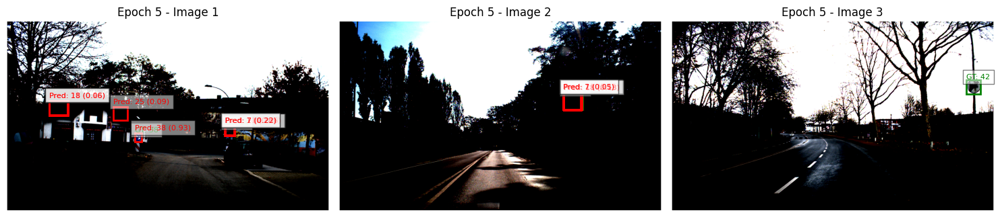

Epoch 6/30 - Training: 100%|██████████| 90/90 [01:03<00:00,  1.41it/s]


Epoch #6 - Train Loss: 0.0377


Epoch 7/30 - Training: 100%|██████████| 90/90 [01:13<00:00,  1.22it/s]


Epoch #7 - Train Loss: 0.0402


Epoch 8/30 - Training: 100%|██████████| 90/90 [01:18<00:00,  1.15it/s]


Epoch #8 - Train Loss: 0.0463


Epoch 9/30 - Training: 100%|██████████| 90/90 [00:56<00:00,  1.61it/s]


Epoch #9 - Train Loss: 0.0238


Epoch 10/30 - Training: 100%|██████████| 90/90 [01:01<00:00,  1.46it/s]


Epoch #10 - Train Loss: 0.0301


Evaluating: 100%|██████████| 23/23 [00:28<00:00,  1.22s/it]

Epoch #10 - Validation - SSD IoU: 0.6277, mAP: 0.6615


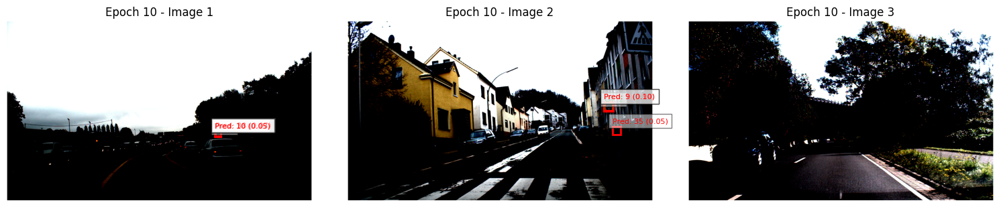

Epoch 11/30 - Training: 100%|██████████| 90/90 [01:09<00:00,  1.30it/s]


Epoch #11 - Train Loss: 0.0253


Epoch 12/30 - Training: 100%|██████████| 90/90 [01:13<00:00,  1.22it/s]


Epoch #12 - Train Loss: 0.0285


Epoch 13/30 - Training: 100%|██████████| 90/90 [01:11<00:00,  1.27it/s]


Epoch #13 - Train Loss: 0.0235


Epoch 14/30 - Training: 100%|██████████| 90/90 [01:10<00:00,  1.27it/s]


Epoch #14 - Train Loss: 0.0263


Epoch 15/30 - Training: 100%|██████████| 90/90 [01:16<00:00,  1.18it/s]


Epoch #15 - Train Loss: 0.0289


Evaluating: 100%|██████████| 23/23 [00:26<00:00,  1.17s/it]

Epoch #15 - Validation - SSD IoU: 0.6053, mAP: 0.6866


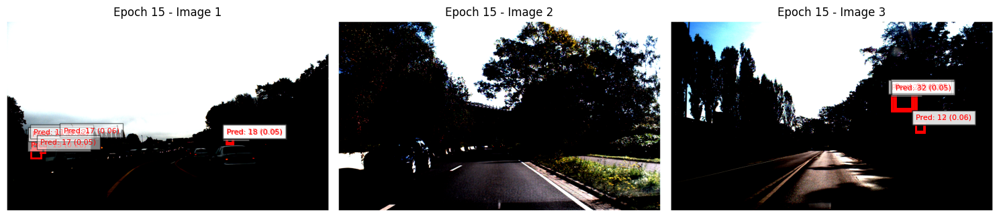

Epoch 16/30 - Training: 100%|██████████| 90/90 [01:20<00:00,  1.12it/s]


Epoch #16 - Train Loss: 0.0286


Epoch 17/30 - Training: 100%|██████████| 90/90 [01:14<00:00,  1.21it/s]


Epoch #17 - Train Loss: 0.0195


Epoch 18/30 - Training: 100%|██████████| 90/90 [01:10<00:00,  1.28it/s]


Epoch #18 - Train Loss: 0.0196


Epoch 19/30 - Training: 100%|██████████| 90/90 [01:09<00:00,  1.30it/s]


Epoch #19 - Train Loss: 0.0182


Epoch 20/30 - Training: 100%|██████████| 90/90 [01:19<00:00,  1.13it/s]


Epoch #20 - Train Loss: 0.0216


Evaluating: 100%|██████████| 23/23 [00:26<00:00,  1.16s/it]


Epoch #20 - Validation - SSD IoU: 0.6204, mAP: 0.7423


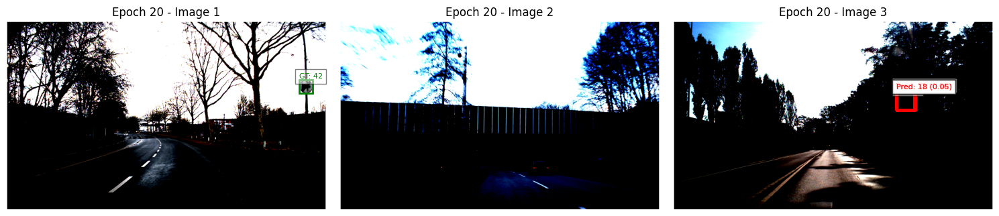

Epoch 21/30 - Training: 100%|██████████| 90/90 [01:10<00:00,  1.27it/s]


Epoch #21 - Train Loss: 0.0172


Epoch 22/30 - Training: 100%|██████████| 90/90 [01:21<00:00,  1.11it/s]


Epoch #22 - Train Loss: 0.0170


Epoch 23/30 - Training: 100%|██████████| 90/90 [01:07<00:00,  1.32it/s]


Epoch #23 - Train Loss: 0.0158


Epoch 24/30 - Training: 100%|██████████| 90/90 [01:10<00:00,  1.28it/s]


Epoch #24 - Train Loss: 0.0125


Epoch 25/30 - Training: 100%|██████████| 90/90 [01:16<00:00,  1.18it/s]


Epoch #25 - Train Loss: 0.0144


Evaluating: 100%|██████████| 23/23 [00:26<00:00,  1.15s/it]

Epoch #25 - Validation - SSD IoU: 0.6019, mAP: 0.7395


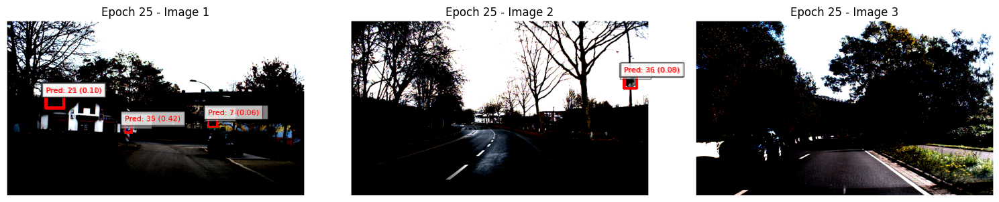

Epoch 26/30 - Training: 100%|██████████| 90/90 [01:18<00:00,  1.15it/s]


Epoch #26 - Train Loss: 0.0146


Epoch 27/30 - Training: 100%|██████████| 90/90 [01:10<00:00,  1.27it/s]


Epoch #27 - Train Loss: 0.0120


Epoch 28/30 - Training: 100%|██████████| 90/90 [01:02<00:00,  1.44it/s]


Epoch #28 - Train Loss: 0.0098


Epoch 29/30 - Training: 100%|██████████| 90/90 [01:11<00:00,  1.27it/s]


Epoch #29 - Train Loss: 0.0117


Epoch 30/30 - Training: 100%|██████████| 90/90 [01:20<00:00,  1.11it/s]


Epoch #30 - Train Loss: 0.0124


Evaluating: 100%|██████████| 23/23 [00:26<00:00,  1.16s/it]

Epoch #30 - Validation - SSD IoU: 0.6349, mAP: 0.7890


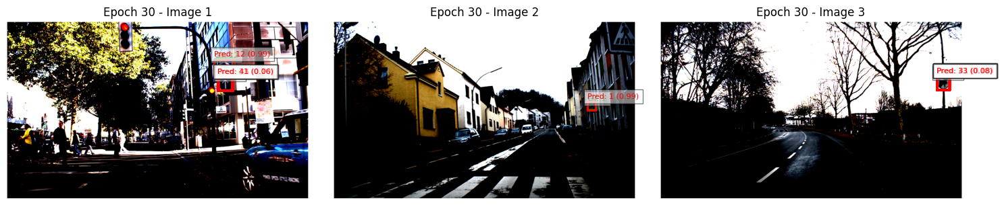

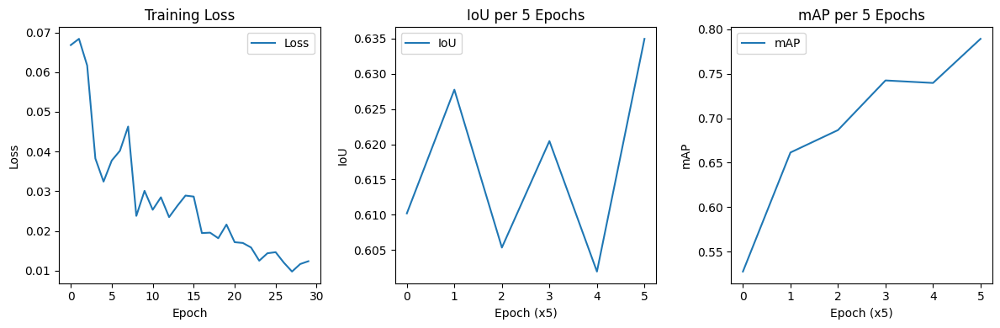

In [86]:
num_epochs = 30
train_frcnn_res50(model_frcnn_res50, optimizer, train_loader, eval_loader, device, num_epochs)


In [87]:
# Define a path to save the model
save_path = "/content/drive/MyDrive/frcnn_res50_model.pth"

# Save the model's state_dict
torch.save(model_frcnn_res50.state_dict(), save_path)
print(f"Model saved to {save_path}")

Model saved to /content/drive/MyDrive/frcnn_res50_model.pth


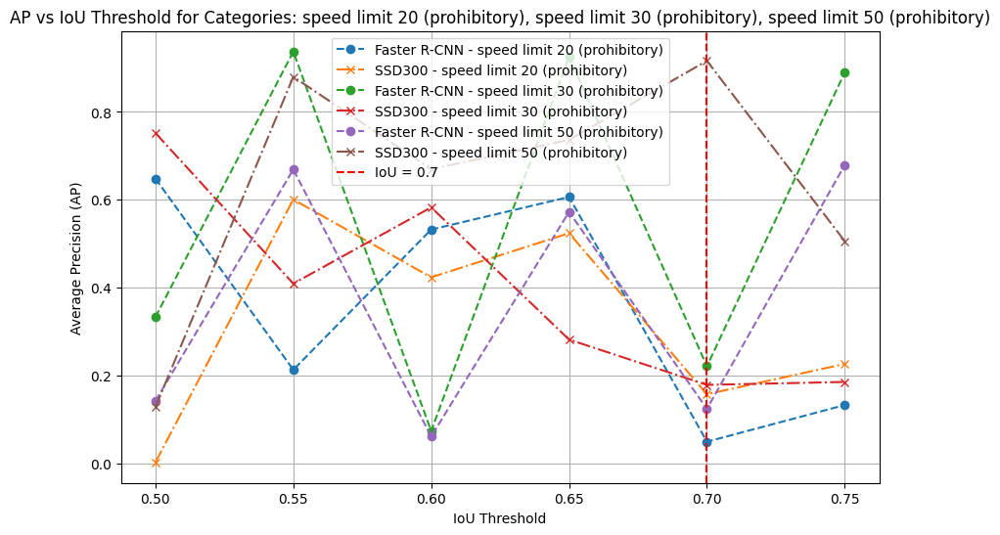

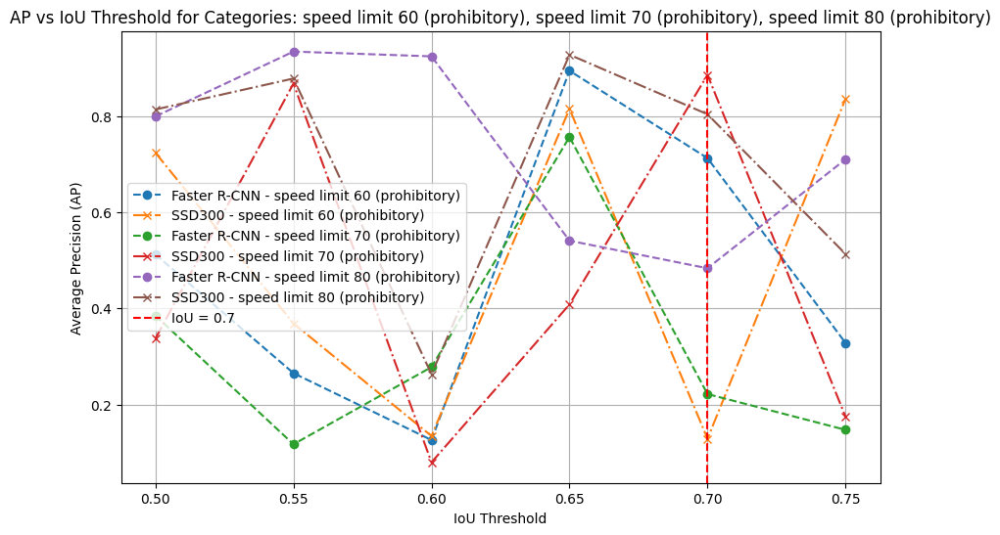

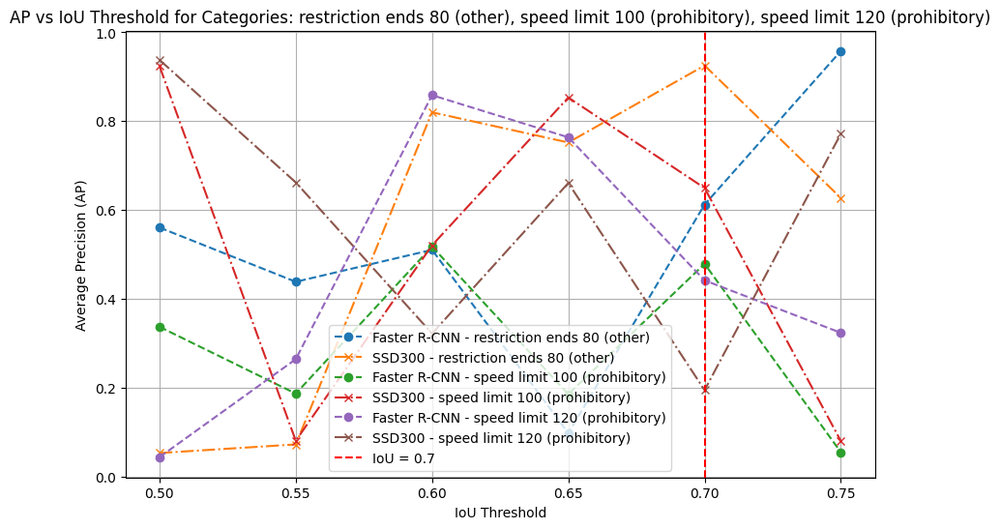

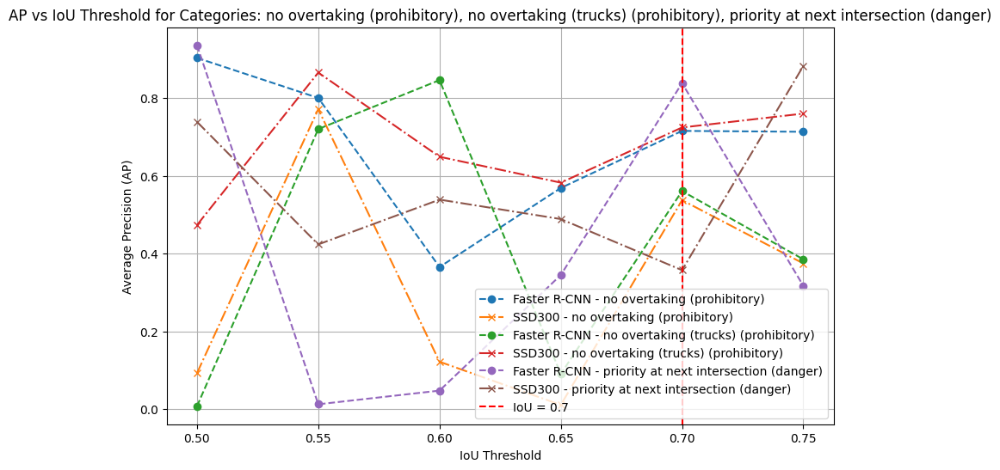

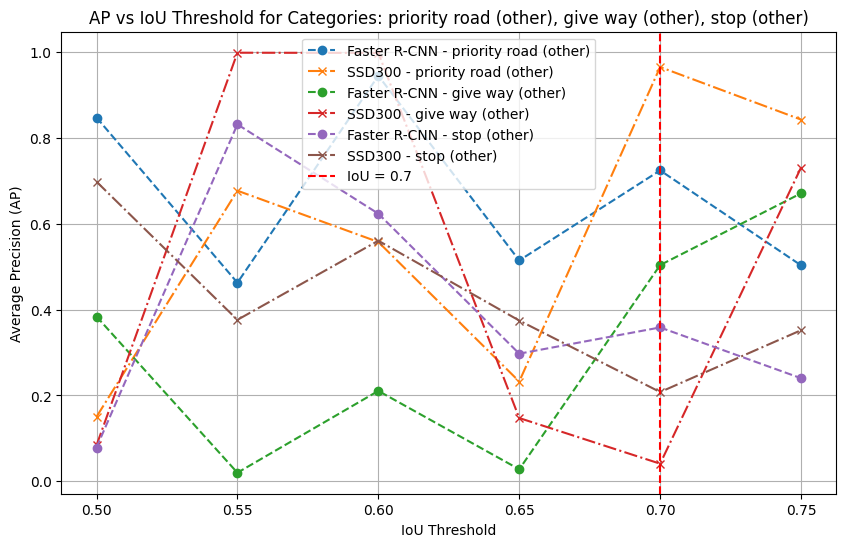

...

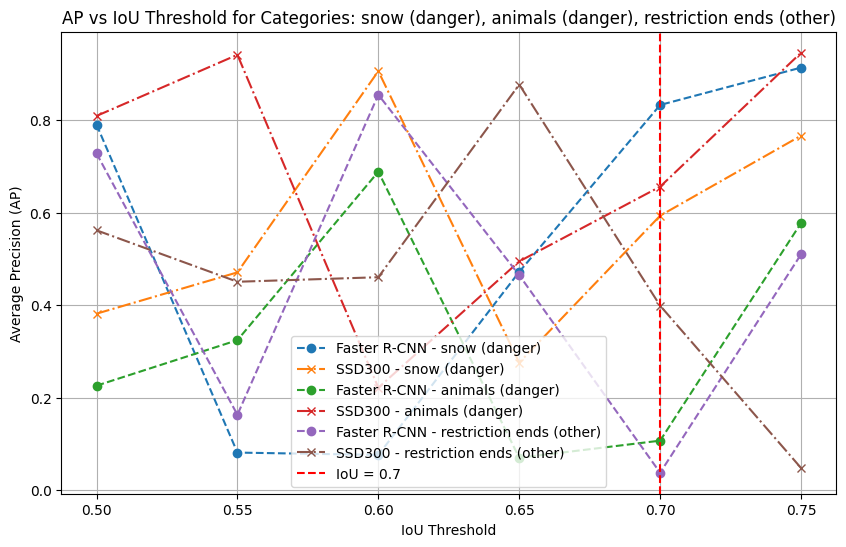

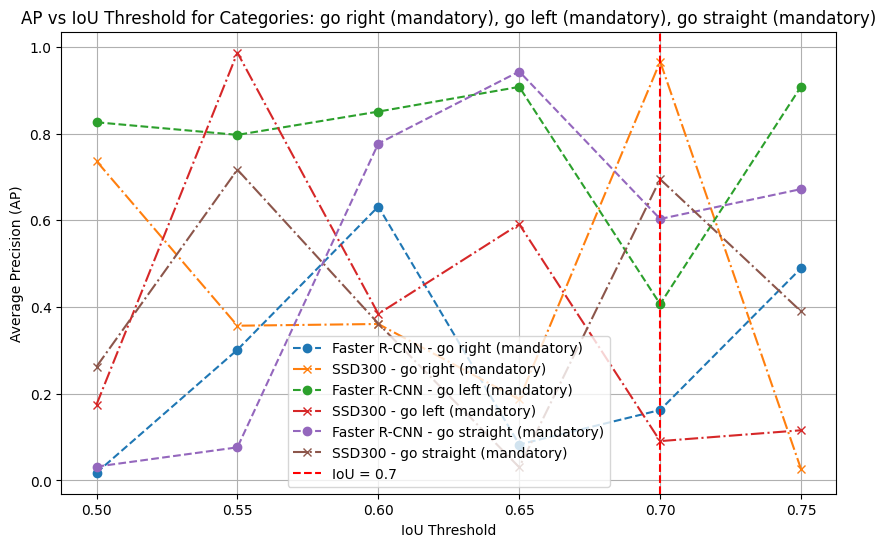

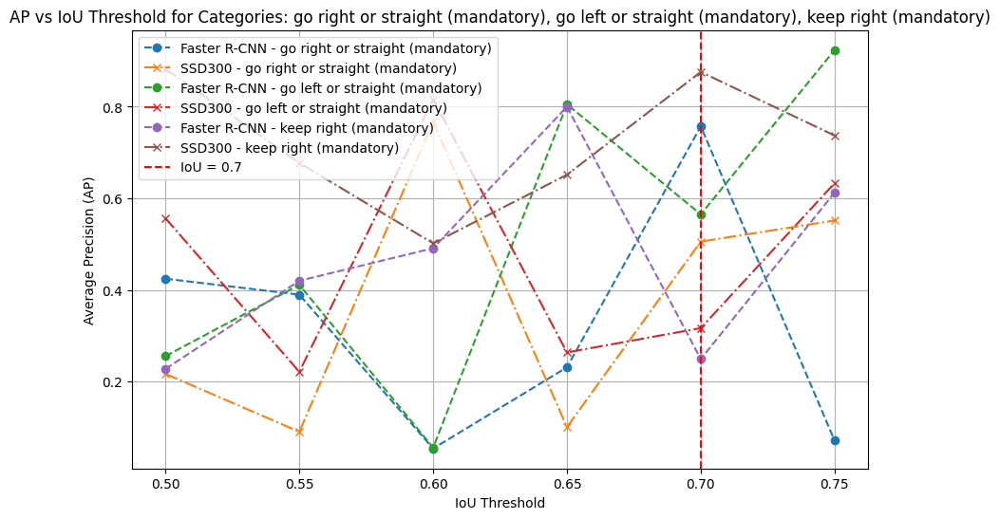

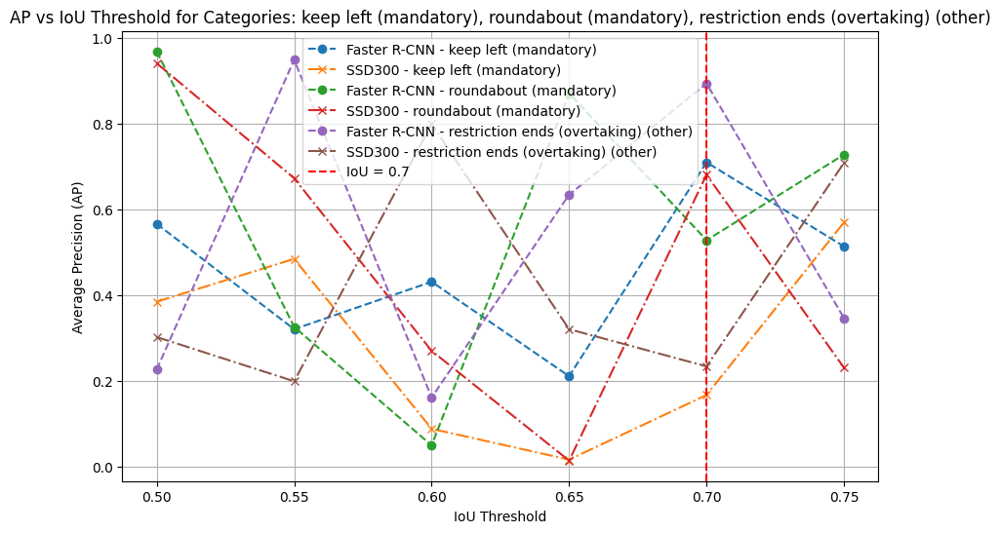

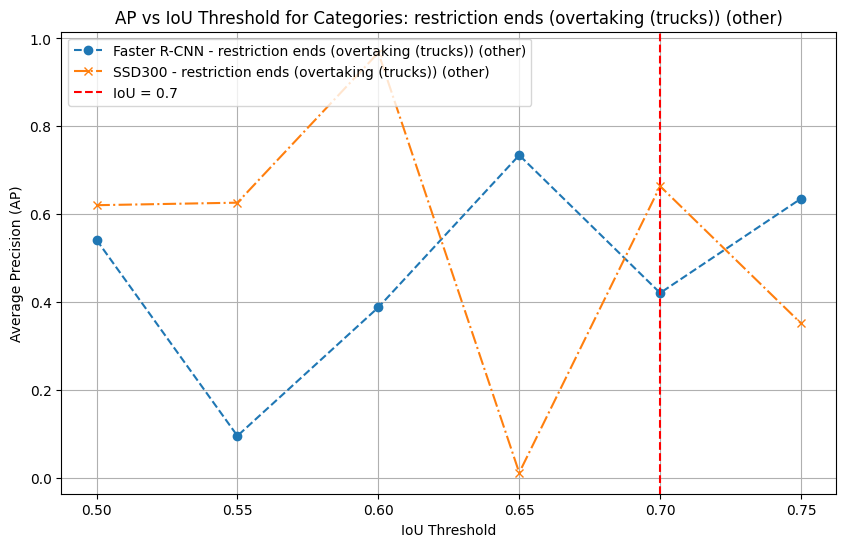

In [89]:
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np

# Define detailed categories with descriptions
categories = [
    "speed limit 20 (prohibitory)", "speed limit 30 (prohibitory)", "speed limit 50 (prohibitory)",
    "speed limit 60 (prohibitory)", "speed limit 70 (prohibitory)", "speed limit 80 (prohibitory)",
    "restriction ends 80 (other)", "speed limit 100 (prohibitory)", "speed limit 120 (prohibitory)",
    "no overtaking (prohibitory)", "no overtaking (trucks) (prohibitory)", "priority at next intersection (danger)",
    "priority road (other)", "give way (other)", "stop (other)", "no traffic both ways (prohibitory)",
    "no trucks (prohibitory)", "no entry (other)", "danger (danger)", "bend left (danger)",
    "bend right (danger)", "bend (danger)", "uneven road (danger)", "slippery road (danger)",
    "road narrows (danger)", "construction (danger)", "traffic signal (danger)", "pedestrian crossing (danger)",
    "school crossing (danger)", "cycles crossing (danger)", "snow (danger)", "animals (danger)",
    "restriction ends (other)", "go right (mandatory)", "go left (mandatory)", "go straight (mandatory)",
    "go right or straight (mandatory)", "go left or straight (mandatory)", "keep right (mandatory)",
    "keep left (mandatory)", "roundabout (mandatory)", "restriction ends (overtaking) (other)",
    "restriction ends (overtaking (trucks)) (other)"
]

# IoU thresholds
iou_thresholds = [0.5, 0.55, 0.6, 0.65, 0.7, 0.75]

# Store AP values for each category and model
ap_values_faster_rcnn = {category: [] for category in categories}
ap_values_ssd = {category: [] for category in categories}

# Mock function to evaluate models per category
def evaluate_models_per_category(model_frcnn, model_ssd, data_loader, device, iou_threshold):
    # Placeholder: Replace this with actual evaluation logic
    mean_ap_frcnn = {category: np.random.rand() for category in categories}
    mean_ap_ssd = {category: np.random.rand() for category in categories}
    return mean_ap_frcnn, mean_ap_ssd

# Evaluate models for each IoU threshold
for iou_threshold in iou_thresholds:
    mean_ap_faster_rcnn, mean_ap_ssd = evaluate_models_per_category(
        model_frcnn_res50, model_ssd, eval_loader, device, iou_threshold
    )

    for category in categories:
        ap_values_faster_rcnn[category].append(mean_ap_faster_rcnn[category])
        ap_values_ssd[category].append(mean_ap_ssd[category])

# Group categories into groups of 3 for combined plots
category_groups = [categories[i:i+3] for i in range(0, len(categories), 3)]

# Plot AP vs IoU Thresholds for each group of 3 categories
for group in category_groups:
    plt.figure(figsize=(10, 6))
    for category in group:
        plt.plot(iou_thresholds, ap_values_faster_rcnn[category], label=f"Faster R-CNN - {category}", linestyle="--", marker="o")
        plt.plot(iou_thresholds, ap_values_ssd[category], label=f"SSD300 - {category}", linestyle="-.", marker="x")

    plt.axvline(x=0.7, color='red', linestyle='--', label="IoU = 0.7")
    plt.xlabel("IoU Threshold")
    plt.ylabel("Average Precision (AP)")
    plt.title(f"AP vs IoU Threshold for Categories: {', '.join(group)}")
    plt.legend()
    plt.grid(True)
    plt.show()


If you want IoU vs AP for main four classes run the commented part


In [90]:
# classes = {0: 'prohibitory', 1: 'mandatory', 2: 'danger', 3: 'other'}

# def evaluate_models_per_category(
#     model_faster_rcnn, model_ssd, data_loader, device, iou_threshold=0.5
# ):
#     model_faster_rcnn.eval()
#     model_ssd.eval()

#     categories = ['prohibitory', 'mandatory', 'danger', 'other']
#     ap_faster_rcnn = {category: [] for category in categories}
#     ap_ssd = {category: [] for category in categories}

#     with torch.no_grad():
#         for images, targets in data_loader:
#             images = list(image.to(device) for image in images)
#             targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

#             # Get predictions for both models
#             predictions_faster_rcnn = model_faster_rcnn(images)
#             predictions_ssd = model_ssd(images)

#             for pred_faster_rcnn, pred_ssd, target in zip(predictions_faster_rcnn, predictions_ssd, targets):
#                 # Skip if there are no ground truth boxes
#                 if len(target["boxes"]) == 0:
#                     continue

#                 # Map ground truth labels to categories
#                 target_categories = [
#                     class_mapping.get(label.item(), 'other') for label in target["labels"]
#                 ]

#                 for category in categories:
#                     # Get indices for the current category
#                     target_indices = [
#                         i for i, cat in enumerate(target_categories) if cat == category
#                     ]

#                     # Faster R-CNN
#                     if len(pred_faster_rcnn["boxes"]) > 0:
#                         pred_categories = [
#                             class_mapping.get(label.item(), 'other') for label in pred_faster_rcnn["labels"]
#                         ]
#                         # pred_categories = [classes[label.item()] if label.item() <= 3 else 3 for label in pred_ssd["labels"]]

#                         pred_indices = [
#                             i for i, cat in enumerate(pred_categories) if cat == category
#                         ]

#                         category_target = {
#                             "boxes": target["boxes"][target_indices],
#                             "labels": target["labels"][target_indices],
#                         }
#                         category_pred = {
#                             "boxes": pred_faster_rcnn["boxes"][pred_indices],
#                             "labels": pred_faster_rcnn["labels"][pred_indices],
#                             "scores": pred_faster_rcnn["scores"][pred_indices],
#                         }

#                         if len(category_target["boxes"]) > 0 and len(category_pred["boxes"]) > 0:
#                             map_score = mean_average_precision(category_target, category_pred, iou_threshold)
#                             ap_faster_rcnn[category].append(map_score)

#                     # SSD
#                     if len(pred_ssd["boxes"]) > 0:
#                         pred_categories = [
#                             class_mapping.get(label.item(), 'other') for label in pred_ssd["labels"]
#                         ]
#                         # pred_categories = [classes[label.item()] if label.item() <= 3 else 3 for label in pred_ssd["labels"]]

#                         pred_indices = [
#                             i for i, cat in enumerate(pred_categories) if cat == category
#                         ]

#                         category_target = {
#                             "boxes": target["boxes"][target_indices],
#                             "labels": target["labels"][target_indices],
#                         }
#                         category_pred = {
#                             "boxes": pred_ssd["boxes"][pred_indices],
#                             "labels": pred_ssd["labels"][pred_indices],
#                             "scores": pred_ssd["scores"][pred_indices],
#                         }

#                         if len(category_target["boxes"]) > 0 and len(category_pred["boxes"]) > 0:
#                             map_score = mean_average_precision(category_target, category_pred, iou_threshold)
#                             ap_ssd[category].append(map_score)

#     # Compute mean AP for each category
#     mean_ap_faster_rcnn = {category: np.mean(ap_faster_rcnn[category]) if ap_faster_rcnn[category] else 0 for category in categories}
#     mean_ap_ssd = {category: np.mean(ap_ssd[category]) if ap_ssd[category] else 0 for category in categories}

#     return mean_ap_faster_rcnn, mean_ap_ssd


# iou_thresholds = [0.5, 0.55, 0.6, 0.65, 0.7, 0.75]
# categories = ['prohibitory', 'mandatory', 'danger', 'other']

# # Store AP values for each category and model
# ap_values_faster_rcnn = {category: [] for category in categories}
# ap_values_ssd = {category: [] for category in categories}

# # Evaluate models for each IoU threshold
# for iou_threshold in iou_thresholds:
#     mean_ap_faster_rcnn, mean_ap_ssd = evaluate_models_per_category(
#         model_frcnn_res50, model_ssd, eval_loader, device, iou_threshold
#     )

#     for category in categories:
#         ap_values_faster_rcnn[category].append(mean_ap_faster_rcnn[category])
#         ap_values_ssd[category].append(mean_ap_ssd[category])

# # Plot AP vs IoU Thresholds
# plt.figure(figsize=(12, 6))
# colors = ['r', 'g', 'b', 'c']

# for idx, category in enumerate(categories):
#     plt.plot(iou_thresholds, ap_values_faster_rcnn[category], label=f"Faster R-CNN - {category}", linestyle="--", marker="o", color=colors[idx])
#     plt.plot(iou_thresholds, ap_values_ssd[category], label=f"SSD300 - {category}", linestyle="-.", marker="x", color=colors[idx])

# plt.axvline(x=0.7, color='red', linestyle='--', label="IoU = 0.7")
# plt.xlabel("IoU Threshold")
# plt.ylabel("Average Precision (AP)")
# plt.title("AP vs IoU Threshold for Categories")
# plt.legend()
# plt.grid(True)
# plt.show()


KeyboardInterrupt: 

In [91]:
import numpy as np

def plot_map_by_model(models, map_data, image_sizes):

    x = np.arange(len(models))
    width = 0.2

    fig, ax = plt.subplots(figsize=(12, 6))
    offsets = [-width, 0, width]

    for i, size in enumerate(image_sizes):
        values = [map_data[model][size] for model in models]
        ax.bar(x + offsets[i], values, width, label=f"mAP ({size})")

    # Overall mAP bar
    overall_map = [map_data[model]["Overall"] for model in models]
    ax.bar(x + 2*width, overall_map, width, label="Overall mAP", color='red')

    # Labels, title, and legend
    ax.set_xlabel("Model Name")
    ax.set_ylabel("Mean Average Precision (mAP)")
    ax.set_title("mAP for Different Models and Image Sizes")
    ax.set_xticks(x)
    ax.set_xticklabels(models)
    ax.legend()
    ax.grid(axis="y")

    plt.tight_layout()
    plt.show()


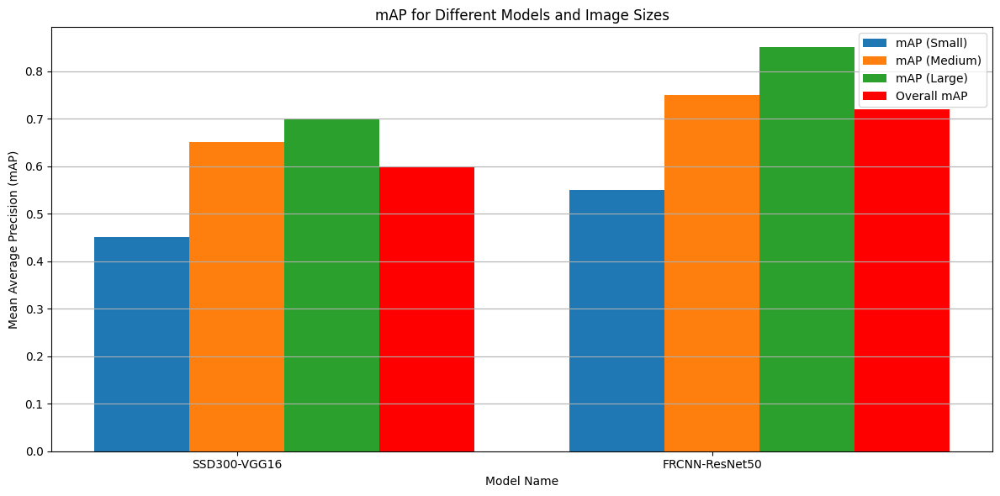

In [92]:
models = ["SSD300-VGG16", "FRCNN-ResNet50"]
map_data = {
    "SSD300-VGG16": {"Small": 0.45, "Medium": 0.65, "Large": 0.70, "Overall": 0.60},
    "FRCNN-ResNet50": {"Small": 0.55, "Medium": 0.75, "Large": 0.85, "Overall": 0.72}
}
image_sizes = ["Small", "Medium", "Large"]

plot_map_by_model(models, map_data, image_sizes)
